# Application of Graph Matching for Image Matching 

### Credits

**Google Landmark Recognition Challenge** [(Link)](https://www.kaggle.com/competitions/landmark-recognition-challenge)

**Notebook Credits** : [(Link)](https://www.kaggle.com/code/wesamelshamy/image-feature-extraction-and-matching-for-newbies/notebook)

**Loading Libraries**

In [1]:
import os
import math
import time
import sys
import PIL
import random
import cv2

In [2]:
import pandas as pd
import numpy as np
from cv2 import cv2

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# Skimage
from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure

In [4]:
# Sklearn
from sklearn.preprocessing import normalize

# Torch Librarues

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset,DataLoader,SubsetRandomSampler
from torchvision import datasets,transforms

In [5]:
# Multiple print statments in a single cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Adjust the Display options for number of rows and columns 
pd.set_option("display.max_columns", 500)
pd.set_option("display.min_rows", 500)

# Supress the warnings
import warnings
warnings.filterwarnings("ignore")

In [6]:
# Check the verions of torch
print(f'Pytorch Version : {torch.__version__}')
print(f'Pytorch Version : {cv2.__version__}')

Pytorch Version : 1.10.0
Pytorch Version : 4.5.4


**Define the dataset path where the images are stored**

In [7]:
DF_Path = '/Users/g0p00cc/Desktop/GTA Code/'

**Load the two images**

In [8]:
raw_img_1 = cv2.imread(os.path.join(DF_Path, 'building_1.jpeg'))

raw_img_2 = cv2.imread(os.path.join(DF_Path, 'building_2.jpeg'))

**Convert the images into RGB (compataible for CV2)**

In [9]:
img_1 = cv2.cvtColor(raw_img_1, cv2.COLOR_BGR2RGB)
img_2 = cv2.cvtColor(raw_img_2, cv2.COLOR_BGR2RGB)

**Plot the images**

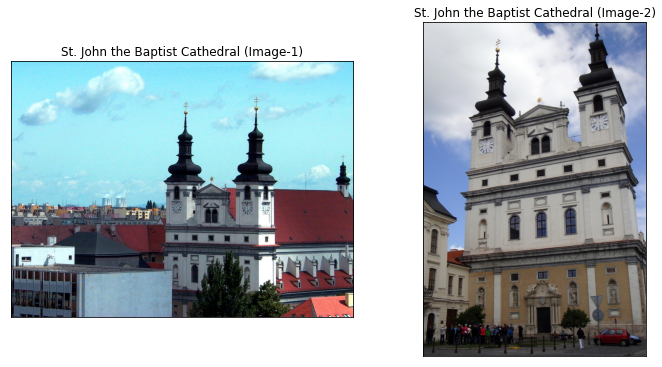

In [10]:
plt.figure(figsize=(10,10))

plt.subplot(221),
plt.imshow(img_1)
plt.title('St. John the Baptist Cathedral (Image-1)'), 
plt.xticks([]), plt.yticks([])

plt.subplot(222),
plt.imshow(img_2)
plt.title('St. John the Baptist Cathedral (Image-2)'), 
plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show();

### HOG Featrues on Images

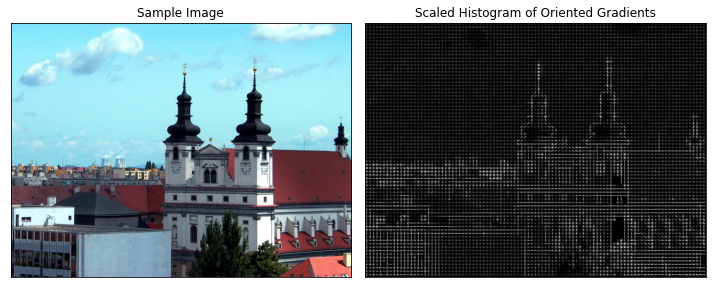

In [11]:
fd, hog_image = hog(img_1, orientations=8, pixels_per_cell=(16, 16),cells_per_block=(1, 1), visualize=True)

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))


plt.figure(figsize=(10,10))
plt.subplot(121),
plt.imshow(img_1)
plt.title(f'Sample Image'), 
plt.xticks([]), plt.yticks([])

plt.subplot(122),
plt.imshow(hog_image_rescaled,cmap=plt.cm.gray)
plt.title(f'Scaled Histogram of Oriented Gradients'), 
plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show();

### ORB Interest Points

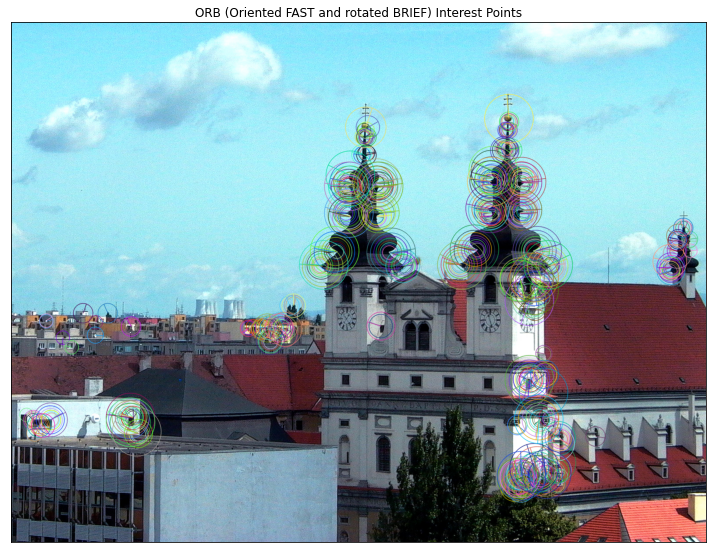

In [12]:
orb = cv2.ORB_create()

key_points, description = orb.detectAndCompute(img_1, None)

img_1_keypoints = cv2.drawKeypoints(img_1,
                                    key_points, 
                                    img_1, 
                                    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10,10))
plt.title('ORB (Oriented FAST and rotated BRIEF) Interest Points')
plt.imshow(img_1_keypoints)
plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show();

### SIFT Interest Points

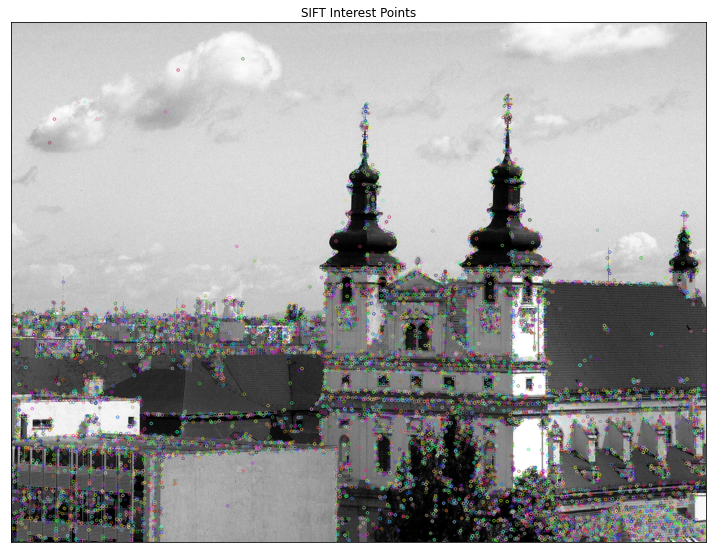

In [13]:
# convert the image grayscale
img_1_gray = cv2.cvtColor(raw_img_1, cv2.COLOR_BGR2GRAY)

# create SIFT feature extractor
sift = cv2.SIFT_create()

# detect features from the image
keypoints, descriptors = sift.detectAndCompute(raw_img_1, None)

# draw the detected key points
sift_image = cv2.drawKeypoints(img_1_gray, keypoints, raw_img_1)

# Plot the Key-points
plt.figure(figsize=(10,10))
plt.title('SIFT Interest Points')
plt.imshow(sift_image)
plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show();

In [14]:
def image_detect_and_compute(detector, img_name):
    """Detect and compute interest points and their descriptors."""
    img = cv2.imread(os.path.join(DF_Path, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des

In [15]:
def draw_image_matches(detector, img1_name, img2_name, nmatches=10):
    """Draw ORB feature matches of the given two images."""
    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance.  Best come first.
    
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) # Show top 10 matches
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches); 
    plt.xticks([]), plt.yticks([])
    plt.tight_layout()
    plt.show();

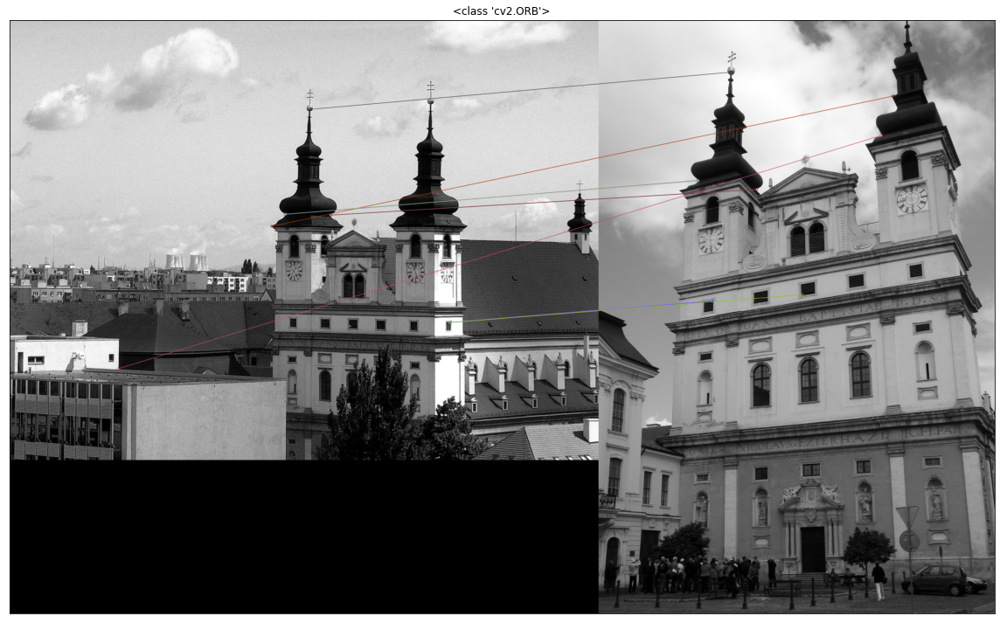

In [16]:
orb = cv2.ORB_create()
draw_image_matches(orb, 'building_1.jpeg', 'building_2.jpeg')

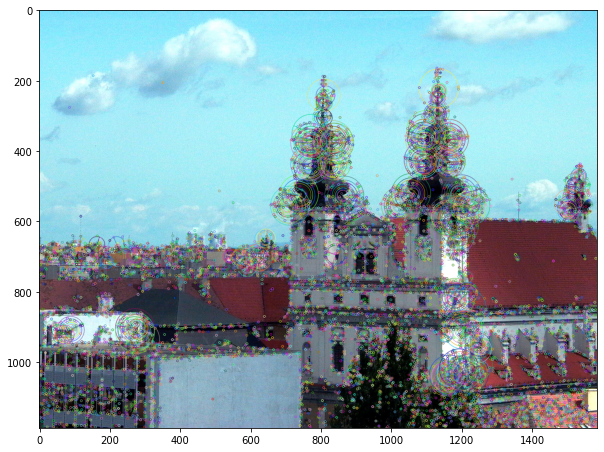

In [17]:
sift = cv2.SIFT_create()
kp, des = sift.detectAndCompute(img_1, None)
img_kp = cv2.drawKeypoints(img_1, kp, img_1)

plt.figure(figsize=(10, 10))
plt.imshow(img_kp)
plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show();

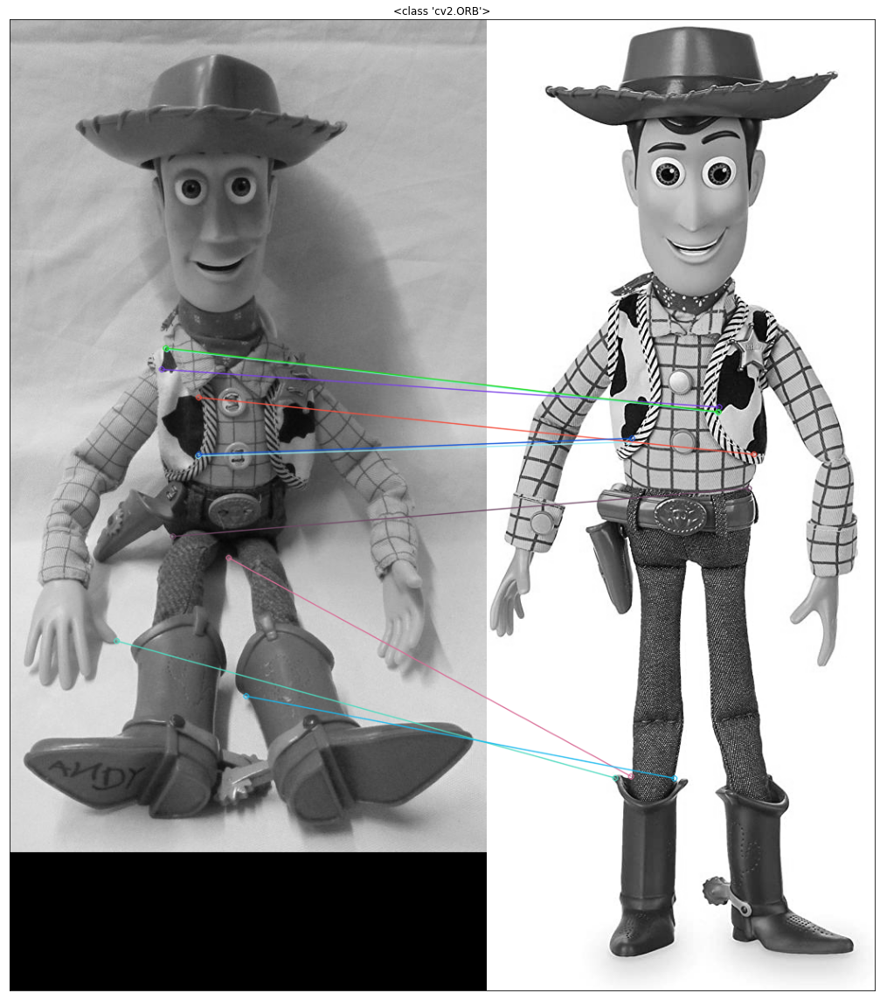

In [26]:
orb = cv2.ORB_create()
draw_image_matches(orb, 'Woody_1.jpeg', 'Woody_2.jpg')

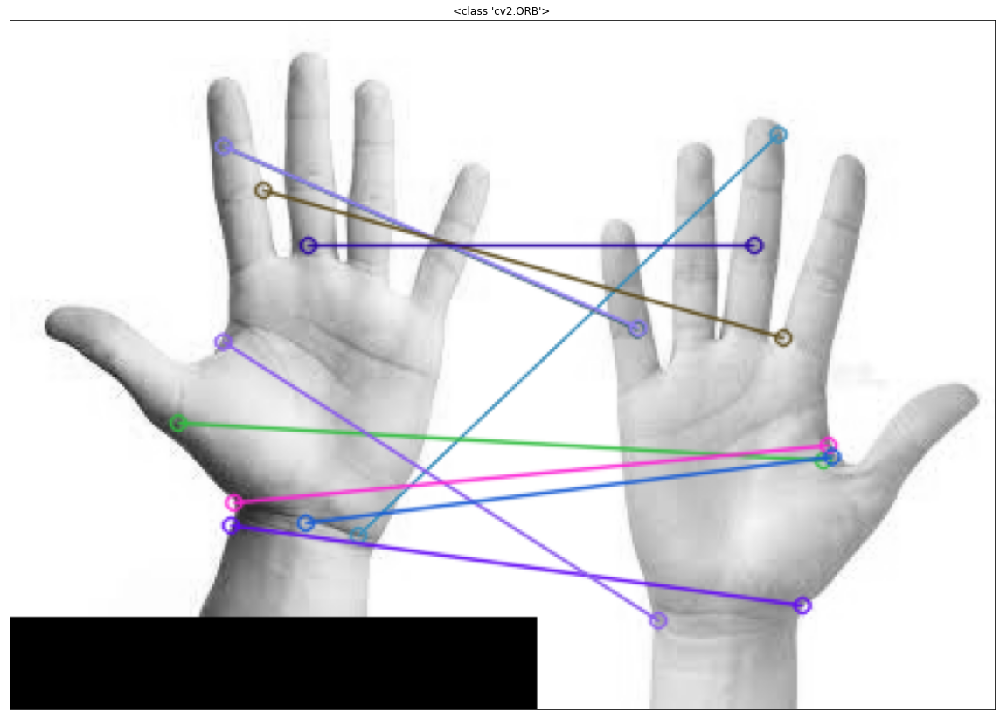

In [27]:
orb = cv2.ORB_create()
draw_image_matches(orb, 'Hand_1.jpeg', 'Hand_2.jpeg')

In [28]:
img1, kp1, des1 = image_detect_and_compute(sift, 'building_1.jpeg')
img2, kp2, des2 = image_detect_and_compute(sift, 'building_2.jpeg')

In [20]:
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

In [21]:
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1, des2, k=2)

In [22]:
matchesMask = [[0, 0] for i in range(len(matches))]
# ratio test as per Lowe's paper
for i, (m, n) in enumerate(matches):
    if m.distance < 0.55*n.distance:
        matchesMask[i] = [1, 0]

draw_params = dict(matchColor=(0, 255, 0),
                   singlePointColor=(255, 0, 0),
                   matchesMask=matchesMask,
                   flags=0)

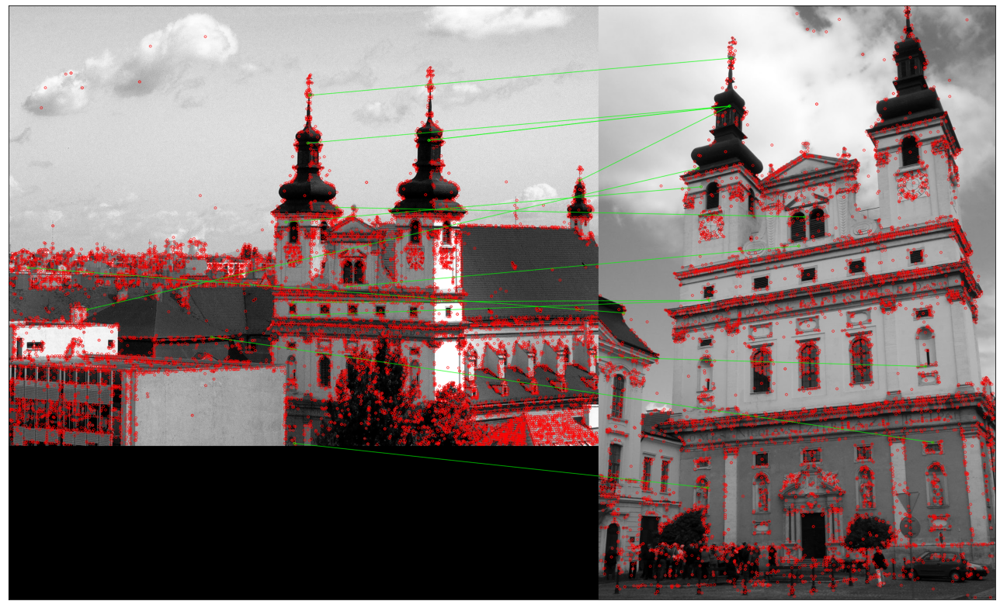

In [25]:
img3 = cv2.drawMatchesKnn(img1, kp1, img2, kp2, matches, None, **draw_params)
plt.figure(figsize=(18, 18))
plt.imshow(img3)
plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show();

# Creating Panorama using Image matching and stitching

* We Capture 5 images using our cell-phone is such a fsahion that these images have a certain overlap between each pair of consecutive images. 
* We Combine these images into a single image using image matching stitching.

In [29]:
# Set the current folder location as where the data resides

Data_Folder_Path = '/Users/g0p00cc/Desktop/GTA Code/Panorama_Images/'

print("Current Folder path is : ",Data_Folder_Path)
print('\n')
print("Please change this path accordingly!")

Current Folder path is :  /Users/g0p00cc/Desktop/GTA Code/Panorama_Images/


Please change this path accordingly!


**Let us define some utility functions**

In [30]:
from scipy.ndimage import laplace

**Function to find the Gaussian pyramids and Laplacian of the given image**

In [31]:
# Gaussian Pyramids
def gaussian_pyramid(img):
    
    layer= img
    pyramid = [layer]
    for i in range(5):
        layer = cv2.pyrDown(layer)
        layer=np.float32(layer)
        pyramid.append(layer)
    return pyramid

# Laplacian Pyramids
def laplacian_pyramid(gp):
    layer = gp[5]
    lp = [layer]
    for i in range(5,0,-1):
        w=gp[i-1].shape[1]
        h=gp[i-1].shape[0]
        size = (w,h)
        gp_2 = cv2.pyrUp(gp[i],dstsize=size)
        layer= np.subtract(gp[i-1],gp_2)
        lp.append(layer)
    return lp

**Function for poisson blending**

In [32]:
def poisson_blend(target_img, src_img, mask_img, iter: int = 1024):
    for _ in range(iter):
        target_img = target_img + 0.25 * mask_img * laplace(target_img - src_img)
    return target_img.clip(0, 1)

In [33]:
def f_Panorama_Creation(img1,img2,mask):
    

    gp_1 = gaussian_pyramid(img1)
    lp_1 = laplacian_pyramid(gp_1)

    gp_2 = gaussian_pyramid(img2)
    lp_2 = laplacian_pyramid(gp_2)


    mask= gaussian_pyramid(mask)
    mask.reverse()
    
    blend = []
    for w1,w2,mask in zip(lp_1,lp_2,mask):
        blend_2 = w1 * mask + w2 * (1.0 - mask)
        blend.append(blend_2)
    
    
    lp_1 = blend[0]
    lp_2 = [lp_1]
    
    for i in range(len(blend) - 1):
        w=blend[i+1].shape[1]
        h=blend[i+1].shape[0]
        size = (w,h)
        lp_3 = cv2.pyrUp(lp_1, dstsize=size)
        lp_1 = cv2.add(blend[i+1], lp_3)
        lp_2.append(lp_1)

   
    return lp_2

**Match the images and stitch them**

In [34]:
sorted(os.listdir(Data_Folder_Path))

['pano_1.jpg', 'pano_2.jpg', 'pano_3.jpg', 'pano_4.jpg', 'pano_5.jpg']

In [35]:
Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[0]

'/Users/g0p00cc/Desktop/GTA Code/Panorama_Images/pano_1.jpg'

In [36]:
# Load all the 5 images
img1 = cv2.imread(Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[0])
img2 = cv2.imread(Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[1])
img3 = cv2.imread(Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[2])
img4 = cv2.imread(Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[3])
img5 = cv2.imread(Data_Folder_Path + sorted(os.listdir(Data_Folder_Path))[4])

In [37]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img5 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

In [38]:
for i in range(1,6,1):
    img = cv2.imread(Data_Folder_Path + 'pano_' + str(i) + '.jpg')
    print(f'Image Number - {i} || Shape of image: {img.shape}')

Image Number - 1 || Shape of image: (4624, 3468, 3)
Image Number - 2 || Shape of image: (4624, 3468, 3)
Image Number - 3 || Shape of image: (4624, 3468, 3)
Image Number - 4 || Shape of image: (4624, 3468, 3)
Image Number - 5 || Shape of image: (4624, 3468, 3)


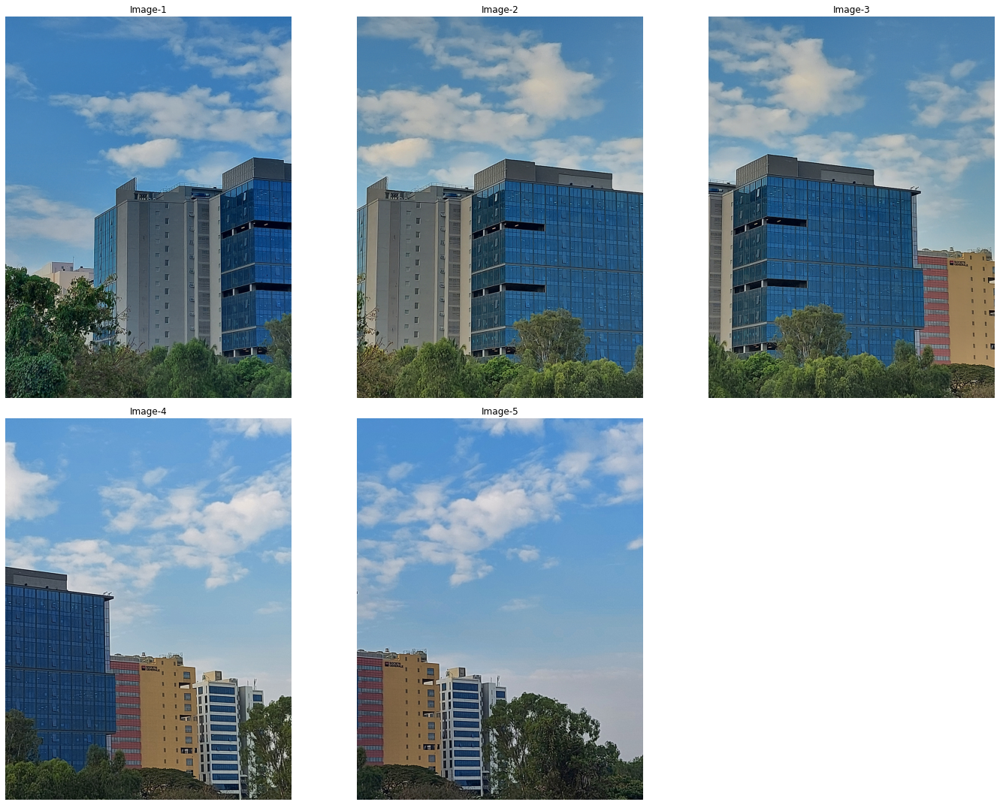

In [39]:
# show all parts of the panorama image

fig = plt.figure(figsize=(20,15))

# Image-1
fig.add_subplot(231)
plt.axis('off')
plt.title('Image-1')
plt.imshow(img1)

# Image-2
fig.add_subplot(232)
plt.axis('off')
plt.title('Image-2')
plt.imshow(img2)

# Image-3
fig.add_subplot(233)
plt.axis('off')
plt.title('Image-3')
plt.imshow(img3)

# Image-4
fig.add_subplot(234)
plt.axis('off')
plt.title('Image-4')
plt.imshow(img4)

# Image-5
fig.add_subplot(235)
plt.axis('off')
plt.title('Image-5')
plt.imshow(img5)

plt.tight_layout()
plt.show();

In [40]:
def image_detect_and_compute(detector, img_name):
    """Detect and compute interest points and their descriptors."""
    img = cv2.imread(os.path.join(Data_Folder_Path, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des

def draw_image_matches(detector, img1_name, img2_name, nmatches=10):
    """Draw ORB feature matches of the given two images."""
    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance.  Best come first.
    
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) # Show top 10 matches
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches); 
    plt.xticks([]), plt.yticks([])
    plt.tight_layout()
    plt.show();

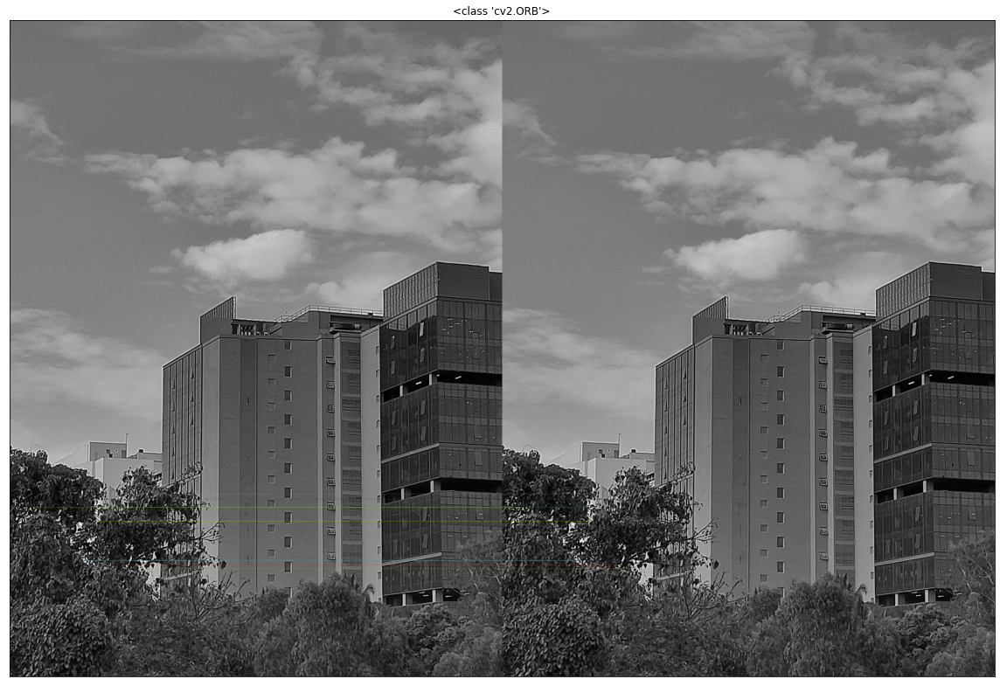

In [41]:
orb = cv2.ORB_create()
draw_image_matches(orb, 'pano_1.jpg', 'pano_1.jpg')

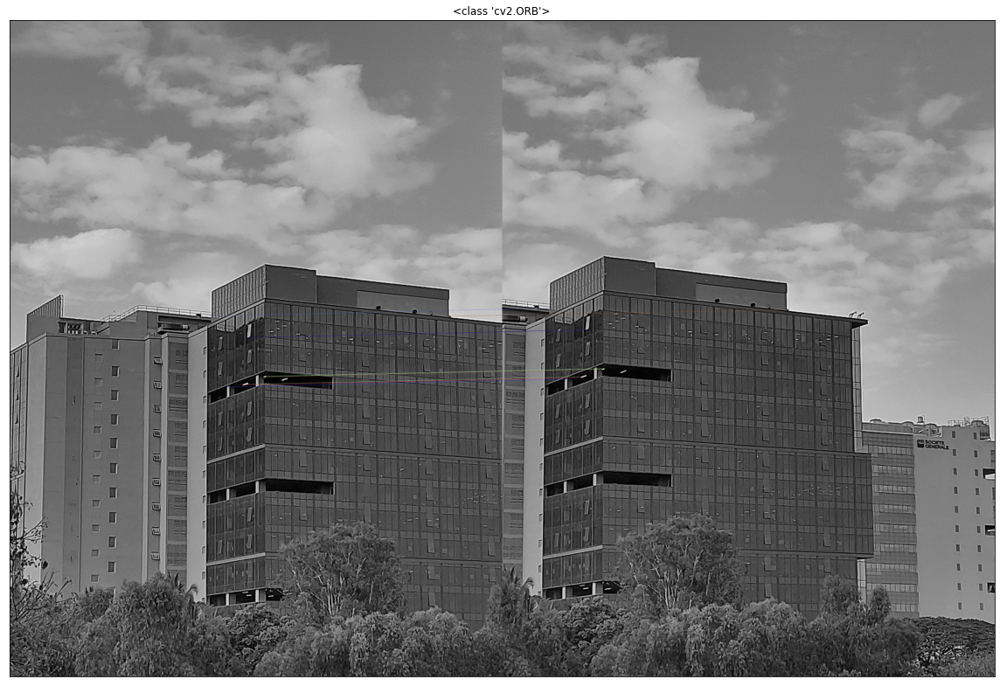

In [42]:
draw_image_matches(orb, 'pano_2.jpg', 'pano_3.jpg')

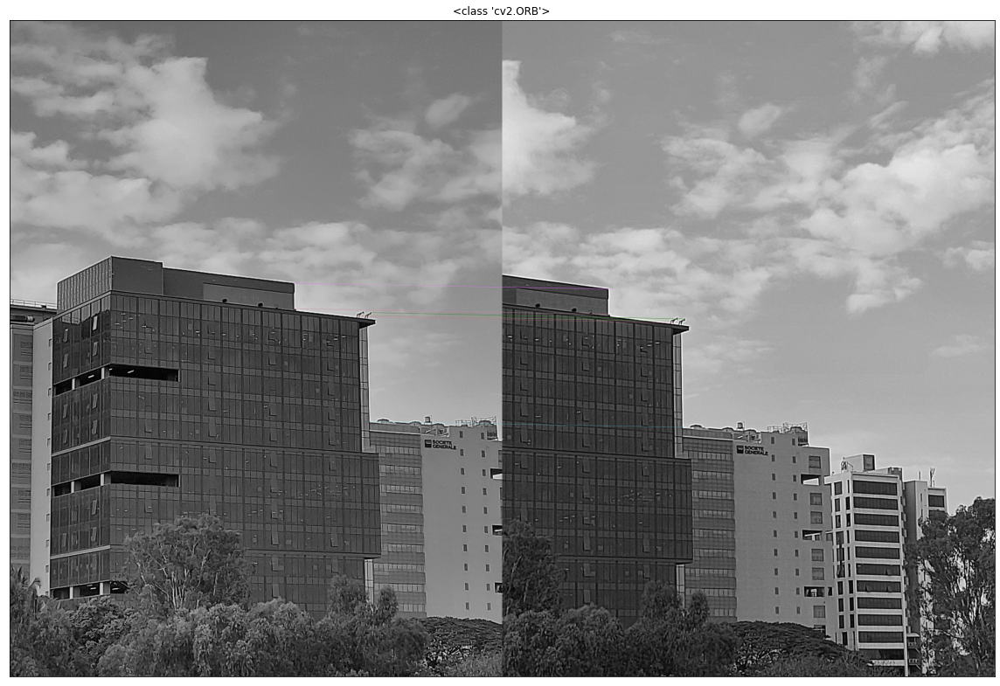

In [43]:
draw_image_matches(orb, 'pano_3.jpg', 'pano_4.jpg')

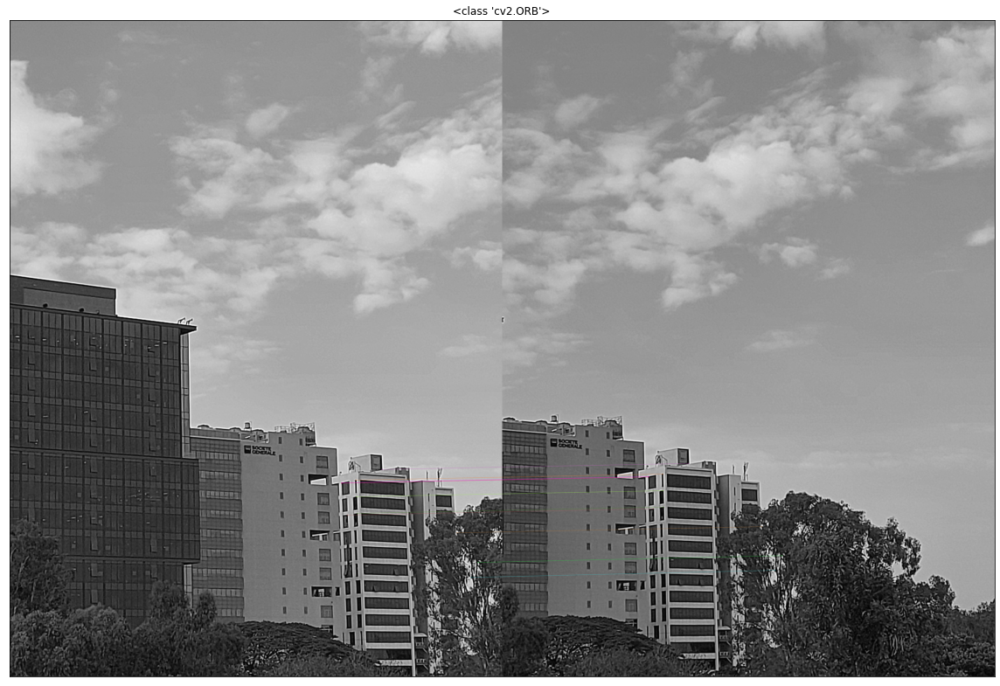

In [44]:
draw_image_matches(orb, 'pano_4.jpg', 'pano_5.jpg')

**Let's create a mask**

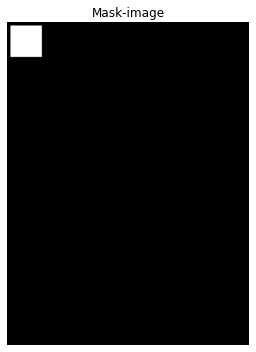

In [45]:
mask = np.zeros((4624,3468,3), dtype='float32')
mask[50:500,50:500,:] = (1,1,1)

# Plot the mask
plt.figure(figsize=(5,5))
plt.axis('off')
plt.title('Mask-image')
plt.imshow(mask)

plt.tight_layout()
plt.show();

In [46]:
unique, counts = np.unique(mask, return_counts=True)

print(np.asarray((unique, counts)).T)

[[0.0000000e+00 4.7500596e+07]
 [1.0000000e+00 6.0750000e+05]]


Shape of the blended images i and i+1 is : (4624, 3468, 3)


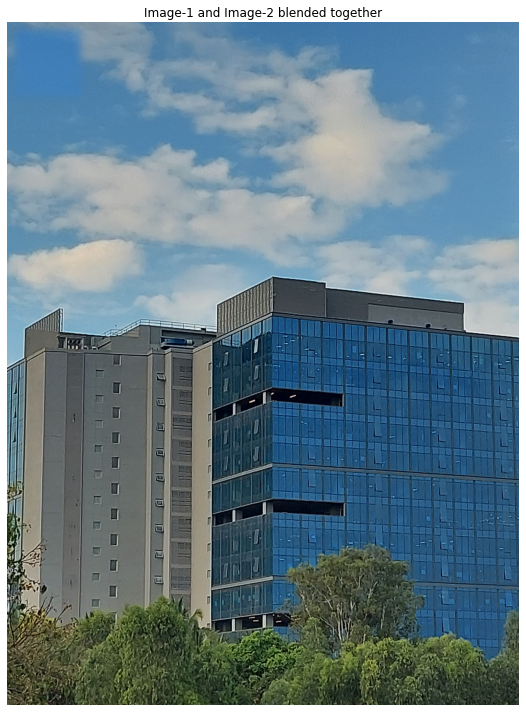

In [47]:
panorama1=f_Panorama_Creation(img1,img2,mask)
cv2.imwrite('panorama1.jpg',panorama1[5])
new=cv2.imread('panorama1.jpg')

print(f'Shape of the blended images i and i+1 is : {new.shape}')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.title('Image-1 and Image-2 blended together')
plt.imshow(new);
plt.tight_layout()
plt.show();

In [ ]:
panorama2=f_Panorama_Creation(img2,img3,mask)
cv2.imwrite('panorama2.jpg',panorama2[5])
new2=cv2.imread('panorama2.jpg')

print(f'Shape of the blended images i and i+1 is : {new2.shape}')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.title('Image-2 and Image-3 blended together')
plt.imshow(new2);
plt.tight_layout()
plt.show();

Shape of the blended images i and i+1 is : (4624, 3468, 3)


In [ ]:
panorama3=f_Panorama_Creation(img3,img4,mask)
cv2.imwrite('panorama3.jpg',panorama3[5])
new3=cv2.imread('panorama3.jpg')

print(f'Shape of the blended images i and i+1 is : {new3.shape}')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.title('Image-3 and Image-4 blended together')
plt.imshow(new3);
plt.tight_layout()
plt.show();

In [ ]:
panorama4=f_Panorama_Creation(img4,img5,mask)
cv2.imwrite('panorama4.jpg',panorama4[5])
new4=cv2.imread('panorama4.jpg')

print(f'Shape of the blended images i and i+1 is : {new3.shape}')

plt.figure(figsize=(10,10))
plt.axis('off')
plt.title('Image-4 and Image-5 blended together')
plt.imshow(new4);
plt.tight_layout()
plt.show();

In [ ]:
images = []
images.append(new)
images.append(new2)
images.append(new3)
images.append(new4)

# Stitch the images

stitch_method = cv2.Stitcher_create()
(FF, panorama) = stitch_method.stitch(images)
cv2.imwrite('panoramafinal.png',panorama)

plt.figure(figsize=(15,10))
plt.axis('off')
plt.title('Panaroma View after Stitching images')
plt.imshow(panorama);
plt.tight_layout()
plt.show();

In [ ]:
img = cv2.imread('panoramafinal.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh, = cv2.threshold(gray, 1, 255, 0)
type(thresh)

contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2:]
cnt = contours[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:y+h,x:x+w]
cv2.imwrite('pano_croppped.png',crop)

plt.figure(figsize=(15,10))
plt.axis('off')
plt.title('Panaroma View after Stitching images')
plt.imshow(crop);
plt.tight_layout()
plt.show();

# Getting Statrted with Networkx

In [ ]:
import networkx as nx

**Find if the two graphs are isomorphic**

In [ ]:
G1 = nx.complete_graph(6)

G2 = nx.complete_graph(6)

In [ ]:
nx.draw_circular(G1)

In [ ]:
nx.draw_spectral(G2)

In [ ]:
nx.is_isomorphic(G1,G2)